# <code style="background:#db4f4f; color:black">Project Details</code>

The objective of the project is to let students have a hands-on experience on machine
learning application development, this will help the students to have a better
understanding on the topics and algorithms learned. Specifically in problem formulation,
data collection and processing, data analysis, experiment design, machine learning
methods comparison, performance evaluation, and result analysis. Each group has its
flexibility to choose its own problem and data.

# <code style="background:#db4f4f; color:black">Problem Background</code>

Diseases are something that plague human beings. The top 10 causes of death in the world are all diseases, not accidents. Out of these 10, 7 of them account for diseases that are noncommunicable. These means that they are diseases that are not transmitted from one person to another. These account for 68% of the top 10 causes of death. If we frame this context at a national level, Singapore shares the same sentiment. The top 10 causes of death are also due to diseases. One of the top 5 causes of death worldwide and in Singappore, is stroke.
<br>
<br>
https://www.who.int/news-room/fact-sheets/detail/the-top-10-causes-of-death
<br>
https://www.moh.gov.sg/others/resources-and-statistics/principal-causes-of-death

# <code style="background:#db4f4f; color:black">Problem Statement</code>

Our project aims to analyse to predict the probability of stroke based of the data of a person's lifestyle habits and medical history.

# <code style="background:#6c89cc; color:black">Data Collection</code>

The dataset used for this problem statement was sourced from Kaggle, a dataset hosting website. It consists of 11 variables, 10 of which are features and 1 of it being the target. The features variables consist of behavioural attributes as well as hereditary attributes that affect a person's probability of getting a stroke.

# <code style="background:#6c89cc; color:black">Load the Libraries</code>

In [3]:
# Libraries
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

from sklearn import ensemble

# Plotly
from plotly import express as px
from plotly import graph_objects as go

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier

# Data Preprocessing
from sklearn.discriminant_analysis import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

# Torch
import torch
from torch.utils.data import TensorDataset, DataLoader
import torch
import torch.nn as nn

# Grid Search
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.inspection import permutation_importance

# <code style="background:#6c89cc; color:black">Load the Dataset</code>

We will be using the variable "df" to denote the instances of the dataset. "df" will be called in the following cells and be used for different purposes. Firstly, we will load the dataset to be used for the project.

In [4]:
# Load the stoke dataset
df = pd.read_csv("../Datasets/stroke_data.csv")

In [5]:
# Display the dimensions of the dataframe (no. of rows, no. of columns)
df.shape

(40910, 11)

In [6]:
#Display a summary of the dataframe (name and no. of columns, number of non-null values in each column, data type of each column)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40910 entries, 0 to 40909
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sex                40907 non-null  float64
 1   age                40910 non-null  float64
 2   hypertension       40910 non-null  int64  
 3   heart_disease      40910 non-null  int64  
 4   ever_married       40910 non-null  int64  
 5   work_type          40910 non-null  int64  
 6   Residence_type     40910 non-null  int64  
 7   avg_glucose_level  40910 non-null  float64
 8   bmi                40910 non-null  float64
 9   smoking_status     40910 non-null  int64  
 10  stroke             40910 non-null  int64  
dtypes: float64(4), int64(7)
memory usage: 3.4 MB


# <code style="background:#6c89cc; color:black">Data Exploration</code>

In Data Exploration, we analyse the loaded dataset to gain better understanding on how it can be harnessed to assist us during the model creation stage.

In [7]:
#Assessing for missing values
df.isnull().sum()

sex                  3
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

Above, we can note that there are null values in the "sex" variable. We do not want to bring this forward into the model creation stage. We will handle this issue when we feature engineer the dataset. Until then, we will conduct more exploratory analysis to find connections and any important information in the variables.

In [8]:
#Evaluating number of unique values in each column
unique_vals=[]

for col in df.columns:
    unival=df[col].nunique()
    unique_vals.append(unival)

#Presenting the findings using a dataframe
pd.DataFrame(unique_vals,columns=['Unique_Values'],index=df.columns)

,Unique_Values
sex,2
age,111
hypertension,2
heart_disease,2
ever_married,2
work_type,5
Residence_type,2
avg_glucose_level,2903
bmi,370
smoking_status,2


In [9]:
# Display the column names of the dataframe
df.columns

Index(['sex', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')

In [10]:
# Create a box plot for Age
fig_age = px.box(df, y="age", title="Distribution of Age",
                 labels={"age": "Age"})
fig_age.update_layout(width=800, height=500)
fig_age.show()

# Create a box plot for Average Glucose Level
fig_glucose = px.box(df, y="avg_glucose_level", title="Distribution of Average Glucose Level",
                     labels={"avg_glucose_level": "Average Glucose Level"})
fig_glucose.update_layout(width=800, height=500)
fig_glucose.show()

# Create a box plot for BMI
fig_bmi = px.box(df, y="bmi", title="Distribution of BMI",
                 labels={"bmi": "BMI"})
fig_bmi.update_layout(width=800, height=500)
fig_bmi.show()

#### Stroke Distribution
Bar Chart

In [11]:
# Create a histogram using Plotly to visualize the distribution of stroke cases
fig = px.histogram(df, x="stroke", color="stroke", barmode="group", color_discrete_map={0: "green", 1: "red"},
                   text_auto=True, title="Distribution of Stroke Cases")

# Update legend labels to be more descriptive
fig.for_each_trace(lambda t: t.update(name={0: 'No Stroke', 1: 'Stroke'}[int(t.name)]))

# Update layout to improve readability
fig.update_layout(legend_title_text="Stroke", legend=dict(title="", traceorder="reversed"),
                  xaxis_title="Stroke", yaxis_title="Count", width=800, height=500)

# Show the plot
fig.show()


The bar chart above shows that the dataset has a balanced number of data points for both stroke and no stroke cases.

#### Stroke vs Age
Box Plot

In [12]:
# Create a box plot using Plotly to visualize the distribution of age by stroke status
fig = px.box(df[df["age"] >= 1], x="stroke", y="age", color="stroke",
             title="Age Distribution by Stroke Status",
             labels={"stroke": "Stroke", "age": "Age"},
             color_discrete_map={0: "blue", 1: "red"})

# Update layout to improve readability and remove legend
fig.update_layout(xaxis=dict(tickmode='array', tickvals=[0, 1], ticktext=['No Stroke', 'Stroke']),
                  showlegend=False, width=800, height=500)

# Show the plot
fig.show()


The box plot above visualizes the distribution of age by stroke status. 

- The median age of individuals who had a stroke (54) is higher compared to those who did not have a stroke (50.5).

- The interquartile range (box height) for both groups spans roughly from 30s to 70s, indicating considerable age variation in both populations

- Both groups have similar age ranges overall, extending from very young (near 0) to elderly (around 100)

- The stroke group appears to have a slightly higher concentration of older individuals, as evidenced by the higher median and the positioning of the box

- There is substantial overlap in age distributions between the two groups, suggesting that while age is a factor in stroke occurrence, it is not the sole determinant




#### Stroke vs Sex
Stacked Bar Chart

In [13]:
# Aggregate counts and create a stacked bar chart
fig = px.bar(df.groupby(["sex", "stroke"]).size().reset_index(name="count"), 
             x="sex", y="count", color="stroke", barmode="stack", 
             color_discrete_map={0: "#1CA53B", 1: "#AA1111"},
             title="Stroke Frequency by Sex",
             labels={"sex": "Sex", "count": "Frequency", "stroke": "Stroke"},
             text="count")  # Add frequency to the bars

# Update x-axis labels to be more descriptive
fig.update_layout(xaxis=dict(tickmode='array', tickvals=[0, 1], ticktext=['Male', 'Female']),
                  width=800, height=500)

fig.show()


The stacked bar chart above visualizes the stroke frequency distribution by sex. 

- While the total sample for females is larger than males, a higher proportion of males experience stroke than females

- This suggests that males expreience strokes relatively higher to their population size than females



#### Correlation Matrix

In [14]:
# Calculate the correlation matrix
corr = df.corr()

# Create annotated heatmap
fig = go.Figure(data=go.Heatmap(
    z=corr.values,
    x=corr.columns,
    y=corr.index,
    colorscale='RdBu',
    colorbar_title="Correlation"
))

# Add text annotations
annotations = [
    dict(
        x=corr.columns[j],
        y=corr.index[i],
        text=str(round(corr.values[i, j], 2)),
        showarrow=False,
        font=dict(color="black" if abs(corr.values[i, j]) < 0.5 else "white")
    )
    for i in range(len(corr.index)) for j in range(len(corr.columns))
]

fig.update_layout(
    title="Correlation Matrix",
    xaxis_title="Features",
    yaxis_title="Features",
    width=800,
    height=500,
    annotations=annotations
)

fig.show()

From the correlation matrix above, we can rank the 3 features that affect the models the most in order.
<br>
Features ranked from most to least important:
<br>
1. avg_glucose_lvl
<br>
2. hypertension
<br>
3. heart_disease

#### Stroke vs Average Glucose Level
Box Plot

In [15]:
# Create a box plot using Plotly to visualize the distribution of average glucose level by stroke status
fig = px.box(df, x="stroke", y="avg_glucose_level", color="stroke",
             title="Average Glucose Level Distribution by Stroke Status",
             labels={"stroke": "Stroke", "avg_glucose_level": "Average Glucose Level"},
             color_discrete_map={0: "blue", 1: "red"})

# Update layout to improve readability, remove legend, and reduce width
fig.update_layout(xaxis=dict(tickmode='array', tickvals=[0, 1], ticktext=['No Stroke', 'Stroke']),
                  showlegend=False, width=800, height=500)

# Show the plot
fig.show()

The box plot above visualizes the distribution of Average Glucose Level by stroke status.

- The median average glucose level of individuals who had a stroke (110.85) is higher compared to those who did not have a stroke(91.9).

- The interquartile range for stroke indicates displays a wider range, indicating greater variability in glucos levels among stroke patients.

-  While both groups have similar minimum values (around 55 mg/dL), the stroke group shows a pronounced right skew toward higher glucose levels.

- This visualization suggests a potential relationship between elevated glucose levels and stroke occurrence, with individuals who experienced strokes tending to have higher and more variable glucose measurements.

### Lifestyle
#### Stroke vs Ever Married
Pie Chart

In [16]:
# Filter only stroke cases
stroke_cases = df[df["stroke"] == 1]

# Replace 0 with "No" and 1 with "Yes" in the ever_married column
stroke_cases["ever_married"] = stroke_cases["ever_married"].map({0: "No", 1: "Yes"})

# Create a pie chart using Plotly to visualize the proportion of stroke cases by marital status
fig = px.pie(stroke_cases, names="ever_married", title="Proportion of Stroke Cases by Marital Status",
             color="ever_married", color_discrete_map={"Yes": "red", "No": "blue"})

# Update layout to improve readability and update legend labels
fig.update_layout(legend_title_text="Marital Status",
                  legend=dict(title="Marital Status", traceorder="reversed"),
                  width=800, height=500)

# Show the plot
fig.show()


C:\Users\Sebert\AppData\Local\Temp\ipykernel_29160\2413580215.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



The pie chart above visualises that a significantly higher proportion of stroke cases have been married

In [17]:
# Create the box plot
fig = px.box(df[df["age"] >= 0], x="ever_married", y="age", color="stroke",
             title="Age Distribution by Marital Status and Stroke",
             labels={"ever_married": "Ever Married", "age": "Age", "stroke": "Stroke"},
             color_discrete_map={0: "blue", 1: "red"})

# Update legend labels to be more descriptive
fig.for_each_trace(lambda t: t.update(name={0: 'No Stroke', 1: 'Stroke'}[int(t.name)]))

# Reverse the order of traces (puts blue boxes first)
fig.data = fig.data[::-1]

# Update layout to improve readability
fig.update_layout(legend_title_text="Stroke", legend=dict(title="", traceorder="normal"),
                  xaxis=dict(tickmode='array', tickvals=[0, 1], ticktext=['No', 'Yes']),
                  width=800, height=500)

fig.show()


The box plot displays age distribution by marital status and stroke occurrence. The graph is divided into two main categories on the x-axis: "No" and "Yes" for the "Ever Married" status, with each category further split by stroke status (blue for "No Stroke" and red for "Stroke")

- For both married and unmarried groups, individuals who experienced strokes (red boxes) tend to have higher median ages compared to those without strokes (blue boxes). This pattern is consistent across both marital statuses.

- The age distribution for stroke patients shows higher medians (54 years) compared to non-stroke individuals (around 50 years) regardless of marital status.

- The interquartile ranges for stroke patients is slightly wider, particularly in the upper quartiles, suggesting more variability in the age of stroke occurrence.

- Both married and unmarried groups show similar age patterns with respect to stroke status, indicating that the relationship between age and stroke incidence remains consistent regardless of marital status.


This visualization effectively illustrates that while age appears to be associated with stroke occurrence, this relationship is maintained across different marital statuses.

#### Stroke vs Work Type
Heat Map<br><br>


In [18]:
# Create a crosstab to count occurrences
work_stroke_ct = pd.crosstab(df["work_type"], df["stroke"])

# Convert it into a heatmap
fig = go.Figure(data=go.Heatmap(
    z=work_stroke_ct.values,
    x=["No Stroke", "Stroke"],
    y=["Never worked", "Children", "Govt Job", "Self Employed", "Private"],
    colorscale="reds"))

fig.update_layout(title="Stroke Occurrence by Work Type",
                  xaxis_title="Stroke",
                  yaxis_title="Work Type",
                  width=800, height=500)

fig.show()

The heatmap shows the distribution of stroke occurrence across different work types. The color intensity represents the frequency count, with darker red indicating higher numbers.

Key observations from this visualization:

- Private sector employees have the highest frequency counts in both the stroke and no-stroke categories, as indicated by the darkest red cells (approximately 12k individuals)

- Self-employed individuals form the second largest group, with moderate frequency counts shown in lighter red

- Government job holders represent a smaller portion of the dataset, with lighter coloration

- Children and those who never worked show the lowest frequency counts across both stroke and no-stroke categories, represented by the lightest colors

The visualization effectively illustrates how stroke occurrence is distributed across different occupational categories, with private sector employees representing the largest segment of the population in the dataset. The consistent pattern across both stroke and no-stroke columns suggests that the work type distribution is similar regardless of stroke status, though the absolute numbers vary significantly.

#### Stroke vs Residence Type
Pie Chart<br><br>


In [19]:
# Filter only stroke cases
stroke_cases = df[df["stroke"] == 1]

# Replace 0 with "Rural" and 1 with "Urban" in the Residence_type column
stroke_cases["Residence_type"] = stroke_cases["Residence_type"].replace({0: "Rural", 1: "Urban"})

# Create a pie chart using Plotly to visualize the proportion of stroke cases by residence type
fig = px.pie(stroke_cases, names="Residence_type",
             title="Proportion of Stroke Cases by Residence Type",
             color="Residence_type")

# Update layout to improve readability and update legend labels
fig.update_layout(legend_title_text="Residence Type",
                  legend=dict(title="Residence Type", traceorder="reversed"),
                  width=800, height=500)

# Show the plot
fig.show()

C:\Users\Sebert\AppData\Local\Temp\ipykernel_29160\1802980855.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



The pie chart shows the proportion of Stroke Cases by Residence Type. The distribution is nearly even between the two residence categories:

- Urban residents account for 52.1% of stroke cases (blue segment)

- Rural residents account for 47.9% of stroke cases (red segment)

This relatively balanced distribution suggests that stroke cases occur at similar rates in both urban and rural settings, with only a slight predominance in urban areas.

#### Stroke vs BMI
Histogram (& box plot)

In [20]:
fig = px.histogram(df, x="bmi", color="stroke",
                   title="BMI Distribution for Stroke vs. No Stroke",
                   labels={"bmi": "BMI", "count": "Frequency"},
                   marginal="box", barmode="overlay",
                   color_discrete_map={0: "blue", 1: "red"})

# Update legend labels to be more descriptive
fig.for_each_trace(lambda t: t.update(name={0: 'No Stroke', 1: 'Stroke'}[int(t.name)]))

# Update layout to improve readability
fig.update_layout(legend_title_text="Stroke", legend=dict(title="", traceorder="reversed"),
                  xaxis_title="BMI", yaxis_title="Count")

fig.show()

The graph displays the BMI distribution for individuals with and without stroke. It combines a box plot (top) with a histogram (bottom) to show both the statistical summary and frequency distribution.

In the box plot:

- The blue box represents the "No Stroke" group, showing a median BMI of 29.1

- The red box represents the "Stroke" group, with a similar median BMI also around 29.7

- Both groups have comparable interquartile ranges 

- The "No Stroke" group has more outliers at higher BMI values 

The histogram below shows the frequency count by BMI value:

- Both groups have peak frequencies in the BMI range of 25-35

- The highest frequency counts reach 698 individuals

- The "No Stroke" group (blue) has a wider distribution extending to higher BMI values

- The "Stroke" group (red) shows slightly higher peaks in certain BMI ranges, particularly around 30-35

Overall, while the central tendencies of BMI are similar between stroke and non-stroke groups, there are subtle differences in the distribution patterns, with stroke cases showing slightly more concentration in the overweight to obese BMI ranges.

#### Stroke vs Smoking Status

In [21]:
# Filter only stroke cases
stroke_cases = df[df["stroke"] == 1]

# Replace 0 with "Rural" and 1 with "Urban" in the Residence_type column
stroke_cases["smoking_status"] = stroke_cases["smoking_status"].replace({0: "No", 1: "Yes"})

# Create a pie chart using Plotly to visualize the proportion of stroke cases by smoking status
fig = px.pie(stroke_cases, names="smoking_status",
             title="Proportion of Stroke Cases by Smoking Status",
             color="smoking_status")

# Update layout to improve readability and update legend labels
fig.update_layout(legend_title_text="Smoking Status",
                  legend=dict(title="Smoking Status", traceorder="reversed"),
                  width=800, height=500)

# Show the plot
fig.show()

C:\Users\Sebert\AppData\Local\Temp\ipykernel_29160\2715183617.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



The pie chart displays the proportion of Stroke Cases by Smoking Status. The visualization shows that among stroke cases:

- 52.3% occurred in individuals who smoke (labeled "Yes"), represented by the blue segment

- 47.7% occurred in non-smokers (labeled "No"), represented by the red segment

This nearly even distribution suggests that while smokers make up a slightly larger proportion of stroke cases in this dataset, both smokers and non-smokers experience substantial stroke risk. The slight majority of stroke cases (52.3%) being associated with smoking aligns with the known relationship between smoking and increased stroke risk

<h3 style="color:#aed6f1">Relationship Analysis</h3>
Hypertension & Heart Disease vs Stroke

In [22]:
# Compute stroke percentages for each (hypertension, heart disease) combination
htn_hd_stroke = df.groupby(["hypertension", "heart_disease"])["stroke"].mean().reset_index()

# Convert hypertension and heart disease to categorical labels
htn_hd_stroke["hypertension"] = htn_hd_stroke["hypertension"].replace({0: "No Hypertension", 1: "Has Hypertension"})
htn_hd_stroke["heart_disease"] = htn_hd_stroke["heart_disease"].replace({0: "No Heart Disease", 1: "Has Heart Disease"})

# Create heatmap
fig = px.imshow(htn_hd_stroke.pivot(index="hypertension", columns="heart_disease", values="stroke"),
                labels=dict(x="Heart Disease", y="Hypertension", color="Stroke Probability"),
                color_continuous_scale="Reds",
                title="Stroke Probability by Hypertension and Heart Disease",
                width=700, height=600)

fig.show()

From the heatmap above, it is observed that the probability of stroke in:
- "Has heart disease only" (0.77%) is > than "has hypertension only" (0.72%)
- Has both hypertension & heart disease is very high (0.83%)
- No hypertension and heart disease is low (0.39%)

<h3 style="color:#aed6f1">Metabolic Health Analysis</h3>
BMI & Average Glucose Level vs Stroke

In [23]:
# Scatter plot with BMI on X-axis and Average Glucose Level on Y-axis
fig = px.scatter(df, x="bmi", y="avg_glucose_level", color="stroke",
                 title="BMI vs. Average Glucose Level with Stroke",
                 labels={"bmi": "BMI", "avg_glucose_level": "Average Glucose Level", "stroke": "Stroke"},
                 )

fig.show()

- Higher BMI values are associated with a higher likelihood of stroke. This aligns with medical knowledge that obesity is a risk factor for stroke.
- Elevated glucose levels are also associated with a higher risk of stroke. This is consistent with the understanding that diabetes and high blood sugar levels increase stroke risk.
- The combination of high BMI and high glucose levels significantly increases the risk of stroke. Individuals with both risk factors should be closely monitored.

# <code style="background:#6c89cc; color:black">Feature Engineering</code>

It is important to conduct feature engineering as we want to ensure that the data is well prepped to be used for the training models. It consists of handling missing values, encoding categorial variables and feature scaling to name a few.

Here, we drop the columns with null values and check to ensure that they have been dropped.

In [24]:
# Drop rows with any missing values
df = df.dropna()

In [25]:
# Display the column names of the dataframe
df.columns

Index(['sex', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')

The bar graph showed us that there were ages that had negative values. This is not physically possible and we have to remove these. So we will clean the data in this step brop removing the rows with negative ages.

In [26]:
# Filter out rows where age is less than 1
df.query('age >= 1', inplace=True)

In [27]:
# Calculate the first and third quartiles for the 'bmi' column
Q1 = df['bmi'].quantile(0.25)
Q3 = df['bmi'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the dataframe to remove outliers in 'bmi'
df = df[(df['bmi'] >= lower_bound) & (df['bmi'] <= upper_bound)]

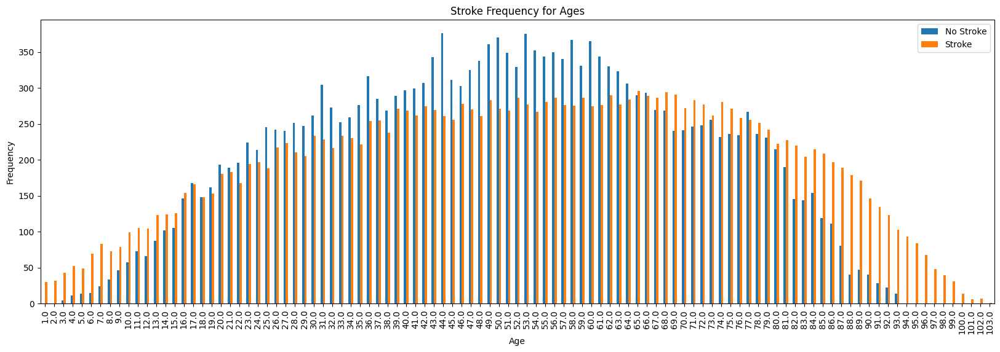

In [28]:
# Create a crosstab to count occurrences of stroke by age and plot it as a bar chart
pd.crosstab(df.age, df.stroke).plot(kind="bar", figsize=(20, 6))

# Add title and labels to the plot
plt.title('Stroke Frequency for Ages')
plt.xlabel('Age')
plt.ylabel('Frequency')

# Update legend to the plot
plt.legend(['No Stroke', 'Stroke'], title="")

# Display the plot
plt.show()


# <code style="background:#6c89cc; color:black">Creating Models</code>

The next step is to create the X and Y arrays. These will then further be split into two more arrays, with each having a "train" and "test" set.

In [29]:
# Define feature matrix X and target vector y
X = df[['sex', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status']].values

# Define target vector y
y = df['stroke'].values

We have chosen 80% for the training set and 20% for the test set.

In [30]:
# Split the dataset into training and testing sets
# X contains the features and y contains the target variable
# test_size=0.2 means 20% of the data will be used for testing and 80% for training
# random_state=5 ensures reproducibility of the split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [31]:
# Print the shape of the training set
print(X_train.shape)

# Print the shape of the test set
print(X_test.shape)

(31924, 10)
(7982, 10)


The SimpleImputer is used to complete any missing values with simple strategies. These strategies are replacing the missing values with the mean, median or mode values from the dataset. It can also use contant values.

In [32]:
# Impute missing values in the training and test sets using the mean strategy
imputer = SimpleImputer(strategy='mean')
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

*Save Scaled data to be use on future inputs that are to be predicted

The StandardScaler is used to normalise the numerical features. It does this by removing the mean and scaling the features to unit variance.

In [33]:
# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Save the fitted scaler to a file
joblib.dump(scaler, '../Models/scaler.pkl')

['../Models/scaler.pkl']

After these steps, we are now ready to run our algorithms. These are a set of 10 models selected to test out our prepared data. When they are run, they will output an accuracy out of 100%. With the results, we will choose a few of the models that we deem are the best fit. These will then be further analysed and modified to allow us to acheive a satisfactory accuracy.

In [34]:
# Define a dictionary with model names as keys and model instances as values
ten_models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(),
    'KNN': KNeighborsClassifier(),
    'GB Classifier': GradientBoostingClassifier(),
    'SGD': SGDClassifier(),
    'AdaBoost': AdaBoostClassifier(algorithm='SAMME'),
    'Naive Bayes': GaussianNB(),
    'MLP Neural Network': MLPClassifier()
}

# Dictionary to store accuracies
accuracies = {}

# Iterate over each model in the dictionary
for name, model in ten_models.items():
    print(f"Training {name}...")  # Print the name of the model being trained
    model.fit(X_train, y_train)  # Train the model on the training data
    y_pred = model.predict(X_test)  # Predict the target values for the test data
    accuracy = accuracy_score(y_test, y_pred)  # Calculate the accuracy of the model
    accuracies[name] = accuracy  # Store the accuracy in the dictionary
    print(f"{name} Accuracy: {accuracy:.2f}")  # Print the accuracy of the model
    print(classification_report(y_test, y_pred))  # Print the classification report for the model

Training Logistic Regression...
Logistic Regression Accuracy: 0.68
              precision    recall  f1-score   support

           0       0.66      0.75      0.70      3982
           1       0.71      0.61      0.66      4000

    accuracy                           0.68      7982
   macro avg       0.68      0.68      0.68      7982
weighted avg       0.68      0.68      0.68      7982

Training Decision Tree...
Decision Tree Accuracy: 1.00
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3982
           1       1.00      1.00      1.00      4000

    accuracy                           1.00      7982
   macro avg       1.00      1.00      1.00      7982
weighted avg       1.00      1.00      1.00      7982

Training Random Forest...
Random Forest Accuracy: 1.00
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3982
           1       1.00      1.00      1.00      4000

    a

c:\Users\Sebert\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.



AdaBoost Accuracy: 0.68
              precision    recall  f1-score   support

           0       0.65      0.77      0.71      3982
           1       0.72      0.59      0.65      4000

    accuracy                           0.68      7982
   macro avg       0.69      0.68      0.68      7982
weighted avg       0.69      0.68      0.68      7982

Training Naive Bayes...
Naive Bayes Accuracy: 0.67
              precision    recall  f1-score   support

           0       0.63      0.79      0.70      3982
           1       0.72      0.54      0.62      4000

    accuracy                           0.67      7982
   macro avg       0.68      0.67      0.66      7982
weighted avg       0.68      0.67      0.66      7982

Training MLP Neural Network...
MLP Neural Network Accuracy: 0.87
              precision    recall  f1-score   support

           0       0.88      0.86      0.87      3982
           1       0.86      0.89      0.87      4000

    accuracy                           0.8

c:\Users\Sebert\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [35]:
# Summary of each model's name and accuracy
for name, accuracy in accuracies.items():
    print(f"{name}: {accuracy:.2f}")


Logistic Regression: 0.68
Decision Tree: 1.00
Random Forest: 1.00
SVM: 0.78
KNN: 0.88
GB Classifier: 0.81
SGD: 0.67
AdaBoost: 0.68
Naive Bayes: 0.67
MLP Neural Network: 0.87


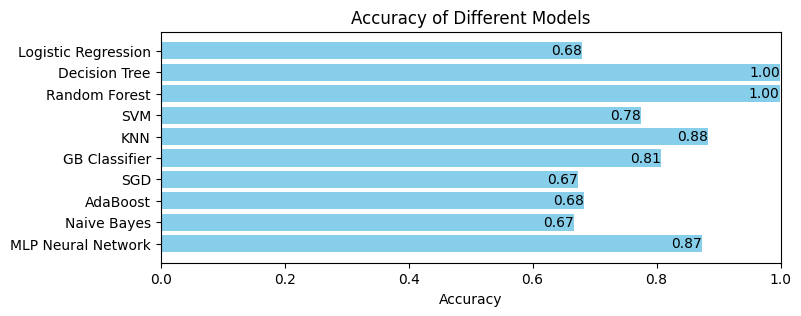

In [36]:
# Create a bar plot for accuracies
plt.figure(figsize=(8, 3))
bars = plt.barh(list(accuracies.keys()), list(accuracies.values()), color='skyblue')
plt.xlabel('Accuracy')
plt.title('Accuracy of Different Models')
plt.xlim(0, 1)
plt.gca().invert_yaxis()

# Add text annotations inside the bars
for bar in bars:
    plt.text(bar.get_width() , bar.get_y() + bar.get_height()/2, f'{bar.get_width():.2f}', va='center', ha='right', color='black')

plt.show()

The graph above plots the accuracies of the different models tested. From this we can conclude that the Decision Tree and Random Forest algorithms give the highest accuracy. They both have accuracies of 100%. The following three best models are the MLP Classifier, the K-Nearest Neighbour and Gradient Boost Classoifier algorithms with 88%, 87% and 80% respectively.
<br>
<br>
An accuracy of 100% is not necessarily a good thing. It can be grounds for overfitting. Overfitting means that the model has learned and matched the training set so well that it is unable to make predicitions on new data that is provided from outside of the initial dataset. Some of the possible causes for overfitting is too complex of a model, too few training exmaples or irrelevant features.

Since the Decision Tree and Random Forest output accuracies of 100%, we want to ensure that this isn't due to overfitting. From the correlation matrix above, we can see that the <b>avg_glucose_lvl</b> feature affects the prediction model the most. To test out the efficacy, we will drop this column and train a new model without it.

In [37]:
# Define feature matrix X and target vector y, excluding 'avg_glucose_level'
X = df[['sex', 'age', 'hypertension', 'heart_disease', 'ever_married', 'work_type', 'Residence_type', 'bmi', 'smoking_status']].values
y = df['stroke'].values

# Initialize an new empty dictionary to store accuracies of different models
accuracies = {}

In [38]:
# Split the dataset into training and testing sets
# X contains the features and y contains the target variable
# test_size=0.2 means 20% of the data will be used for testing and 80% for training
# random_state=5 ensures reproducibility of the split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [39]:
# Define a dictionary with model names as keys and model instances as values
no_agl_models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(),
    'KNN': KNeighborsClassifier(),
    'GB Classifier': GradientBoostingClassifier(),
    'SGD': SGDClassifier(),
    'AdaBoost': AdaBoostClassifier(algorithm='SAMME'),
    'Naive Bayes': GaussianNB(),
    'MLP Neural Network': MLPClassifier()
}

# Iterate over each model in the dictionary
for name, model in no_agl_models.items():
    print(f"Training {name}...")  # Print the name of the model being trained
    model.fit(X_train, y_train)  # Train the model on the training data
    y_pred = model.predict(X_test)  # Predict the target values for the test data
    accuracy = accuracy_score(y_test, y_pred)  # Calculate the accuracy of the model
    accuracies[name] = accuracy  # Store the accuracy in the dictionary
    print(f"{name} Accuracy: {accuracy:.2f}")  # Print the accuracy of the model
    print(classification_report(y_test, y_pred))  # Print the classification report for the model

Training Logistic Regression...
Logistic Regression Accuracy: 0.66
              precision    recall  f1-score   support

           0       0.63      0.76      0.69      3982
           1       0.70      0.55      0.62      4000

    accuracy                           0.66      7982
   macro avg       0.67      0.66      0.65      7982
weighted avg       0.67      0.66      0.65      7982

Training Decision Tree...


c:\Users\Sebert\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\linear_model\_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Decision Tree Accuracy: 0.95
              precision    recall  f1-score   support

           0       0.95      0.96      0.95      3982
           1       0.96      0.95      0.95      4000

    accuracy                           0.95      7982
   macro avg       0.95      0.95      0.95      7982
weighted avg       0.95      0.95      0.95      7982

Training Random Forest...
Random Forest Accuracy: 0.95
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      3982
           1       0.94      0.96      0.95      4000

    accuracy                           0.95      7982
   macro avg       0.95      0.95      0.95      7982
weighted avg       0.95      0.95      0.95      7982

Training SVM...
SVM Accuracy: 0.66
              precision    recall  f1-score   support

           0       0.63      0.77      0.69      3982
           1       0.71      0.55      0.62      4000

    accuracy                           0.66      7982
   macro 

c:\Users\Sebert\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.



AdaBoost Accuracy: 0.67
              precision    recall  f1-score   support

           0       0.62      0.83      0.71      3982
           1       0.75      0.50      0.60      4000

    accuracy                           0.67      7982
   macro avg       0.69      0.67      0.66      7982
weighted avg       0.69      0.67      0.66      7982

Training Naive Bayes...
Naive Bayes Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.61      0.84      0.71      3982
           1       0.75      0.46      0.57      4000

    accuracy                           0.65      7982
   macro avg       0.68      0.65      0.64      7982
weighted avg       0.68      0.65      0.64      7982

Training MLP Neural Network...
MLP Neural Network Accuracy: 0.72
              precision    recall  f1-score   support

           0       0.72      0.72      0.72      3982
           1       0.72      0.71      0.72      4000

    accuracy                           0.7

c:\Users\Sebert\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [40]:
# Summary of each model's name and accuracy
for name, accuracy in accuracies.items():
    print(f"{name}: {accuracy:.2f}")


Logistic Regression: 0.66
Decision Tree: 0.95
Random Forest: 0.95
SVM: 0.66
KNN: 0.73
GB Classifier: 0.77
SGD: 0.62
AdaBoost: 0.67
Naive Bayes: 0.65
MLP Neural Network: 0.72


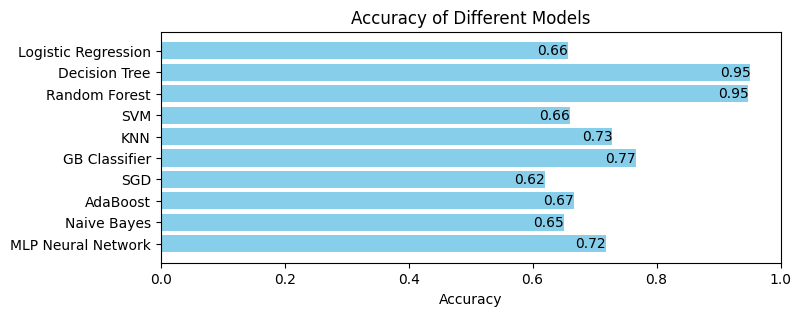

In [41]:

# Create a bar plot for accuracies
plt.figure(figsize=(8, 3))
bars = plt.barh(list(accuracies.keys()), list(accuracies.values()), color='skyblue')
plt.xlabel('Accuracy')
plt.title('Accuracy of Different Models')
plt.xlim(0, 1)
plt.gca().invert_yaxis()

# Add text annotations inside the bars
for bar in bars:
    plt.text(bar.get_width() , bar.get_y() + bar.get_height()/2, f'{bar.get_width():.2f}', va='center', ha='right', color='black')
    
plt.show()

As seen in the bar graph, the accuracy of the Decision Tree and Random Forest has dropped. From an initial accuracy of 100% to 96% and 95% respectively. From this, we can conclude that <b>avg_glucose_lvl</b> is an important feature which affects the accuracy of these models. This is also further proved by the fact that the accuracies of the other models have dropped as well. All these informations point towards the fact that the models did not initially overfit as hypothesised. As such, we can use them for prediction.

# <code style="background:#6c89cc; color:black">K-Nearest Neighbours</code>

The K-Nearest Neighbours algorithm is a supervised learning method. It uses proximity between data points to make classification or predictions.

In [42]:
# Define feature matrix X and target vector y
X = df[['sex', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status']].values

# Define target vector y
y = df['stroke'].values

In [43]:
# Split the dataset into training and testing sets
# X contains the features and y contains the target variable
# test_size=0.2 means 20% of the data will be used for testing and 80% for training
# random_state=5 ensures reproducibility of the split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [44]:
# Impute missing values in the training and test sets using the mean strategy
imputer = SimpleImputer(strategy='mean')
X_train = imputer.fit_transform(X_train)
X_test = imputer.transform(X_test)

In [45]:
# Standardize features
scaler = StandardScaler()

# Fit the scaler on the training data and transform it
X_train = scaler.fit_transform(X_train)

# Transform the test data using the fitted scaler
X_test = scaler.transform(X_test)

In [46]:
#Setup arrays to store training and test accuracies
neighbors = np.arange(1,9)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    #Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k, metric='euclidean')

    #Fit the model
    knn.fit(X_train, y_train)

    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train, y_train)

    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test, y_test)

Generate an elbow plot so that we can estimate the specific number of neighbours used when training the KNN model

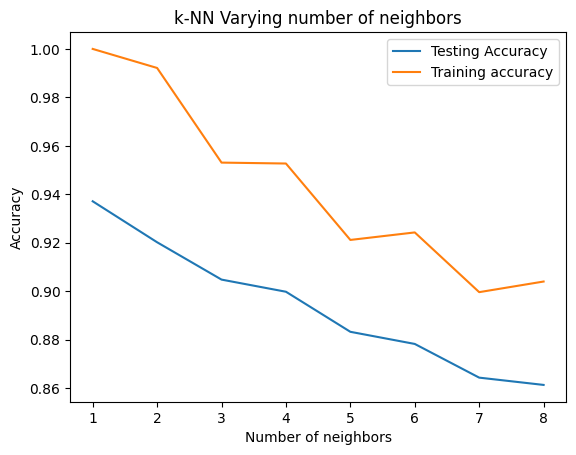

In [47]:
#Generate elbow plot
plt.title('k-NN Varying number of neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy')
plt.plot(neighbors, train_accuracy, label='Training accuracy')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [48]:
param_grid = {
    'n_neighbors': [7, 9, 11],        # Different values for the number of neighbors
    'weights': ['uniform', 'distance'],      # Weight function: 'uniform' means equal weight, 'distance' means closer neighbors have more influence
    'p': [1, 2],                              # p=1 for Manhattan distance, p=2 for Euclidean distance
    'metric': ['minkowski', 'euclidean', 'manhattan']
}

In [49]:
grid_search_knn = GridSearchCV(estimator=knn,
                               param_grid=param_grid,
                               cv=5,                # 5-fold cross-validation
                               scoring='accuracy',  # Optimize based on accuracy
                               n_jobs=-1)           # Use all available cores

In [50]:
# Fit grid search on the training data.
grid_search_knn.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=KNeighborsClassifier(metric='euclidean',
                                            n_neighbors=np.int64(8)),
             n_jobs=-1,
             param_grid={'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': [7, 9, 11], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [51]:
# Retrieve the best model and parameters.
knn_model = grid_search_knn.best_estimator_
print("Best parameters for KNN:", grid_search_knn.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search_knn.best_score_))

Best parameters for KNN: {'metric': 'minkowski', 'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Best cross-validation score: 0.90


In [52]:
# Evaluate the Model
y_pred_knn = knn_model.predict(X_test)
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(f"KNN Accuracy: {accuracy_knn:.2f}")
print(classification_report(y_test, y_pred_knn))

KNN Accuracy: 0.92
              precision    recall  f1-score   support

           0       1.00      0.84      0.91      3982
           1       0.86      1.00      0.92      4000

    accuracy                           0.92      7982
   macro avg       0.93      0.92      0.92      7982
weighted avg       0.93      0.92      0.92      7982



In [53]:
joblib.dump(knn_model, '../Models/trained_knn.pkl')

['../Models/trained_knn.pkl']

# <code style="background:#6c89cc; color:black">Gradient Boosting Classification</code>

Gradient Boosting is a supervised learning method. It can be used for both classification and regression. Due to the nature of the dataset, we have used it for classification purposes. It is an ensemble algorithm that builds weak learners in sequential manner. Each tree then corrects the errors of the previous one, resulting in a stronger predictive model.

In [54]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100],  # Number of boosting stages to be run
    'learning_rate': [0.0001, 0.001],  # Learning rate shrinks the contribution of each tree
    'max_depth': [5, 10],  # Maximum depth of the individual regression estimators
    'min_samples_leaf': [10, 15],  # Minimum number of samples required to be at a leaf node
    'min_samples_split': [20, 40],  # Minimum number of samples required to split an internal node
    'max_features': ['sqrt', 'log2', 0.5],  # Number of features to consider when looking for the best split
    'loss': ['deviance', 'exponential'],  # Loss function to be optimized
    'ccp_alpha': [0.009], # Complexity parameter used for Minimal Cost-Complexity Pruning
    'subsample': [0.5, 0.7]  # Fraction of samples used for fitting the individual base learners
}

In [55]:
# Initialize the Gradient Boosting Classifier with a fixed random state for reproducibility
gbc = ensemble.GradientBoostingClassifier(random_state=5)

In [56]:
# Set up GridSearchCV with 5-fold cross-validation.
grid_search_gbc = GridSearchCV(estimator=gbc,
                           param_grid=param_grid,
                           cv=5,
                           scoring='accuracy',
                           n_jobs=-1)

In [57]:
# Fit the Gradient Boosting Classifier on the training data using GridSearchCV
grid_search_gbc.fit(X_train, y_train)

c:\Users\Sebert\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning:


960 fits failed out of a total of 1920.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
774 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Sebert\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Sebert\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1382, in wrapper
    estimator._validate_params()
  File "c:\Users\Sebert\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklear

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=5),
             n_jobs=-1,
             param_grid={'ccp_alpha': [0.009], 'learning_rate': [0.0001, 0.001],
                         'loss': ['deviance', 'exponential'],
                         'max_depth': [5, 10],
                         'max_features': ['sqrt', 'log2', 0.5],
                         'min_samples_leaf': [10, 15],
                         'min_samples_split': [20, 40],
                         'n_estimators': [50, 100], 'subsample': [0.5, 0.7]},
             scoring='accuracy')

In [58]:
# Retrieve the best model and its parameters.
print("Best parameters for Gradient Boosting Classifier:", grid_search_gbc.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search_gbc.best_score_))
gbc_model = grid_search_gbc.best_estimator_

Best parameters for Gradient Boosting Classifier: {'ccp_alpha': 0.009, 'learning_rate': 0.001, 'loss': 'exponential', 'max_depth': 10, 'max_features': 0.5, 'min_samples_leaf': 15, 'min_samples_split': 20, 'n_estimators': 50, 'subsample': 0.5}
Best cross-validation score: 0.71


In [59]:
# Evaluate the best model on the test set.
y_pred = gbc_model.predict(X_test)
accuracy_best = accuracy_score(y_test, y_pred)
print(f"Optimized Gradient Boosting Classifier Accuracy: {accuracy_best:.2f}")
print(classification_report(y_test, y_pred))

Optimized Gradient Boosting Classifier Accuracy: 0.72
              precision    recall  f1-score   support

           0       0.74      0.68      0.71      3982
           1       0.70      0.76      0.73      4000

    accuracy                           0.72      7982
   macro avg       0.72      0.72      0.72      7982
weighted avg       0.72      0.72      0.72      7982



In [60]:
joblib.dump(gbc_model, '../Models/trained_gbc.pkl')

['../Models/trained_gbc.pkl']

# <code style="background:#6c89cc; color:black">MLP</code>

The MLP Classifier is a Multi-Layer Perceptron that is designed for classification tasks. It uses backpropagation and preprocessing by handling it internally

In [61]:
# Define a parameter grid for the MLP model.
param_grid = {
    'hidden_layer_sizes': [(50,), (25, 25)],  # Different configurations for hidden layers
    'alpha': [2],                   # L2 regularization parameter
    'learning_rate_init': [0.001, 0.01],     # Initial learning rate
    'learning_rate': ['invscaling', 'adaptive'],  # Learning rate schedule
    'activation': ['relu', 'tanh'],          # Activation functions
    'solver': ['adam', 'sgd'],               # Optimization algorithms
    'early_stopping': [True],                # Whether to use early stopping
}

In [62]:
# Initialize the MLPClassifier with max_iter and early_stopping.
mlp = MLPClassifier(max_iter=1000, early_stopping=True, random_state=5)

In [63]:
# Set up GridSearchCV with 5-fold cross-validation.
grid_search_mlp = GridSearchCV(estimator=mlp,
                               param_grid=param_grid,
                               cv=5,
                               scoring='accuracy',
                               n_jobs=-1)

In [64]:
# Training the MLP model
grid_search_mlp.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=MLPClassifier(early_stopping=True, max_iter=1000,
                                     random_state=5),
             n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh'], 'alpha': [2],
                         'early_stopping': [True],
                         'hidden_layer_sizes': [(50,), (25, 25)],
                         'learning_rate': ['invscaling', 'adaptive'],
                         'learning_rate_init': [0.001, 0.01],
                         'solver': ['adam', 'sgd']},
             scoring='accuracy')

In [65]:
# Retrieve the best model and parameters.
mlp_model = grid_search_mlp.best_estimator_
print("Best parameters for MLP:", grid_search_mlp.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search_mlp.best_score_))

Best parameters for MLP: {'activation': 'relu', 'alpha': 2, 'early_stopping': True, 'hidden_layer_sizes': (25, 25), 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'solver': 'adam'}
Best cross-validation score: 0.73


In [66]:
# Predict the target values for the test data using the trained MLP model
y_pred = mlp_model.predict(X_test)

# Calculate the accuracy of the MLP model
accuracy = accuracy_score(y_test, y_pred)
print(f"MLP Neural Network Accuracy: {accuracy:.2f}")

# Print the classification report for the MLP model
print(classification_report(y_test, y_pred))

MLP Neural Network Accuracy: 0.73
              precision    recall  f1-score   support

           0       0.73      0.72      0.73      3982
           1       0.73      0.74      0.73      4000

    accuracy                           0.73      7982
   macro avg       0.73      0.73      0.73      7982
weighted avg       0.73      0.73      0.73      7982



In [67]:
joblib.dump(mlp_model, '../Models/trained_mlp.pkl')

['../Models/trained_mlp.pkl']

MLP Neural Network

The MLP Neural Network is in the same vein as the classifier above. The difference being that we have manual control over the layers, activation functions, loss functions and optimisers. It is suitable for complex architectures.

Since we are using pytorch, we have to convert the data to pytorch tensors

In [68]:
# Convert the training data to PyTorch tensors
X_train_tensor = torch.FloatTensor(X_train)
y_train_tensor = torch.LongTensor(y_train)

# Convert the test data to PyTorch tensors
X_test_tensor = torch.FloatTensor(X_test)
y_test_tensor = torch.LongTensor(y_test)

A tensor dataset with a dataloader of batch size 8 is created. The shuffle of the dataloader for the training data should be true, and that of the test should be false.

In [69]:
from torch.utils.data import TensorDataset, DataLoader

# Create TensorDatasets for training and testing data
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

# Create DataLoaders for training and testing data
# batch_size defines the number of samples that will be propagated through the network
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)  # Shuffle training data
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)  # Do not shuffle testing data

In [70]:
# Properties of train and test datasets
print("Properties of train/test datasets")
print("Train dataset length:", len(train_dataset))  # Print the length of the train dataset
print("First element of train dataset:", train_dataset[0])  # Print the first element of the train dataset
print("Test dataset length:", len(test_dataset))  # Print the length of the test dataset
print("First element of test dataset:", test_dataset[0])  # Print the first element of the test dataset

# Properties of train and test loader
print("\nProperties of loaders")
print("Number of batches in train loader:", len(train_loader))  # Print the number of batches in the train loader
print("Batch size in train loader:", train_loader.batch_size)  # Print the batch size in the train loader
print("Number of batches in test loader:", len(test_loader))  # Print the number of batches in the test loader
print("Batch size in test loader:", test_loader.batch_size)  # Print the batch size in the test loader

Properties of train/test datasets
Train dataset length: 31924
First element of train dataset: (tensor([ 0.8978, -0.6314, -0.5212, -0.3877, -2.1367,  0.6892,  0.9718, -0.4715,
        -1.1907, -0.9933]), tensor(1))
Test dataset length: 7982
First element of test dataset: (tensor([ 0.8978,  1.5090, -0.5212, -0.3877,  0.4680,  0.6892, -1.0291, -0.4330,
        -0.5903, -0.9933]), tensor(1))

Properties of loaders
Number of batches in train loader: 3991
Batch size in train loader: 8
Number of batches in test loader: 998
Batch size in test loader: 8


Here, we create and instantiate the MLP class. It only has two functions, the init and forward function. We have set the three layers with certain parameters.

In [71]:
import torch
import torch.nn as nn

# Check if CUDA is available, otherwise use CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define the MLP class inheriting from nn.Module
class MLP(nn.Module):
    def __init__(self):
        super().__init__()
        # Flatten layer to convert input to a 1D tensor
        self.flatten = nn.Flatten()
        # Define a sequential stack of linear and ReLU layers
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(2, 64),  # Input layer to hidden layer with 64 neurons
            nn.ReLU(),         # ReLU activation function
            nn.Linear(64, 32), # Hidden layer with 64 neurons to another hidden layer with 32 neurons
            nn.ReLU(),         # ReLU activation function
            nn.Linear(32, 2),  # Output layer with 2 neurons (for binary classification)
        )

    def forward(self, x):
        x = self.flatten(x)  # Flatten the input tensor
        logits = self.linear_relu_stack(x)  # Pass the input through the sequential stack
        return logits

# Instantiate the model and move it to the appropriate device
model = MLP().to(device)

# Print model architecture
print(model)

MLP(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=2, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=32, bias=True)
    (3): ReLU()
    (4): Linear(in_features=32, out_features=2, bias=True)
  )
)


In [72]:
# Define the optimizer with Stochastic Gradient Descent (SGD) and a learning rate of 0.01
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

# Define the loss function as Cross Entropy Loss
criterion = nn.CrossEntropyLoss()

# Print properties of optimizer and criterion
print("Properties of optimizer and criterion:")
print("Optimizer:", optimizer)
print("Criterion:", criterion)

Properties of optimizer and criterion:
Optimizer: SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 0.01
    maximize: False
    momentum: 0
    nesterov: False
    weight_decay: 0
)
Criterion: CrossEntropyLoss()


The training loop is run here with the epoch set to 100. We have taken note of the fact that there will be a matrix dimension mismatch during the forward pass. This is due to the inner dimension not matching. This was rectified by flattening each sample while preserving the batch dimension. This will help to match the input dimension expected by the model.

In [73]:
num_epochs = 100  # Number of epochs for training
logs = []  # List to store logs

# Print the shape of the first batch to check input and label shapes
print(f"First batch shape check:")
for inputs, labels in train_loader:
    print(f"Input shape: {inputs.shape}, Labels shape: {labels.shape}")
    break

# Set the device to GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)  # Move the model to the appropriate device

# Update the input layer of the model to match the input shape
model.linear_relu_stack[0] = nn.Linear(inputs.shape[1], 64).to(device)

# Training loop
for epoch in range(num_epochs):
    running_loss = 0.0  # Initialize running loss for the epoch
    for inputs, labels in train_loader:
        inputs = inputs.to(device)  # Move inputs to the appropriate device
        labels = labels.to(device)  # Move labels to the appropriate device

        outputs = model(inputs)  # Forward pass: compute model output

        loss = criterion(outputs, labels)  # Compute the loss

        optimizer.zero_grad()  # Zero the gradients
        loss.backward()  # Backward pass: compute gradients
        optimizer.step()  # Update model parameters

        running_loss += loss.item()  # Accumulate the loss

    epoch_loss = running_loss / len(train_loader)  # Compute average loss for the epoch

    # Log and print the loss every 20 epochs
    if epoch % 20 == 0:
        logs.append(f"Epoch {epoch}, Loss: {epoch_loss:.4f}")
        print(f"Epoch {epoch}, Loss: {epoch_loss:.4f}")


First batch shape check:
Input shape: torch.Size([8, 10]), Labels shape: torch.Size([8])
Epoch 0, Loss: 0.6055
Epoch 20, Loss: 0.4376
Epoch 40, Loss: 0.3756
Epoch 60, Loss: 0.3428
Epoch 80, Loss: 0.3221


In [74]:
# Set the model to evaluation mode
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for inputs, labels in test_loader:
        # Move tensors to device and ensure correct formats
        inputs = inputs.to(device).float()
        labels = labels.to(device)  # For classification, keep as integers

        # Set the forward pass
        outputs = model(inputs)

        # For regression tasks, compare if predictions are close to targets
        # For classification tasks, get the predicted class
        if outputs.shape != labels.shape:
            if outputs.dim() > 1 and outputs.size(1) > 1:
                # Classification task with multiple output classes
                _, predicted = torch.max(outputs, 1)
                correct += (predicted == labels).sum().item()
            else:
                # Regression task
                outputs = outputs.view(-1)
                predicted = outputs.round()  # Round to nearest integer for evaluation
                correct += (predicted == labels).sum().item()
        else:
            # Direct comparison
            predicted = outputs.round()
            correct += (predicted == labels).sum().item()

        # Get the number of observations in the batch
        total += labels.size(0)

mlp_accuracy = correct / total
print(f'Test Accuracy: {mlp_accuracy * 100:.2f}%')

Test Accuracy: 85.69%


# <code style="background:#6c89cc; color:black">Decision Tree</code>

The Decision Tree is a supervised learning algorithm. It can be used for both classification and regression tasks. It is also able to capture non-linear relationships making it powerful. It utilised a tree-like model to recursively make decisions and understand it's consequences.

In [75]:
# Define feature matrix X and target vector y
X = df[['sex', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status']].values

# Define target vector y
y = df['stroke'].values

In [76]:
# Split the dataset into training and testing sets
# X contains the features and y contains the target variable
# test_size=0.2 means 20% of the data will be used for testing and 80% for training
# random_state=5 ensures reproducibility of the split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=5)

In [77]:
# Initialize the SimpleImputer with the mean strategy
imputer = SimpleImputer(strategy='mean')

# Fit the imputer on the training data and transform it
X_train = imputer.fit_transform(X_train)

# Transform the test data using the fitted imputer
X_test = imputer.transform(X_test)

In [78]:
# Standardize features
scaler = StandardScaler()

# Fit the scaler on the training data and transform it
X_train = scaler.fit_transform(X_train)

# Transform the test data using the fitted scaler
X_test = scaler.transform(X_test)

In [177]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'max_depth': [10, 15],  # Maximum depth of the tree
    'min_samples_split': [10, 20, 30, 50],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [10, 15, 20],  # Minimum number of samples required to be at a leaf node
    'max_features': ['sqrt', 'log2', 0.5, 0.3],  # Number of features to consider when looking for the best split
    'criterion': ['gini', 'entropy'],  # Function to measure the quality of a split
    'ccp_alpha': [0.008]  # Complexity parameter used for Minimal Cost-Complexity Pruning
}

In [178]:
# Initialize the DecisionTreeClassifier with a fixed random state for reproducibility
dt = DecisionTreeClassifier(random_state=5)

In [179]:
# Set up GridSearchCV with 5-fold cross-validation.
grid_search_dt = GridSearchCV(estimator=dt,
                              param_grid=param_grid,
                              cv=5,
                              scoring='accuracy',
                              n_jobs=-1)

In [180]:
# Fit the GridSearchCV object on the training data to find the best hyperparameters
grid_search_dt.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=5), n_jobs=-1,
             param_grid={'ccp_alpha': [0.008], 'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 15],
                         'max_features': ['sqrt', 'log2', 0.5, 0.3],
                         'min_samples_leaf': [10, 15, 20],
                         'min_samples_split': [10, 20, 30, 50]},
             scoring='accuracy')

In [181]:
# Retrieve and print the best parameters and cross-validation score.
dt_model = grid_search_dt .best_estimator_
print("Best parameters for Decision Tree:", grid_search_dt .best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search_dt .best_score_))

Best parameters for Decision Tree: {'ccp_alpha': 0.008, 'criterion': 'entropy', 'max_depth': 15, 'max_features': 0.5, 'min_samples_leaf': 20, 'min_samples_split': 10}
Best cross-validation score: 0.70


In [182]:
# Evaluate the Model
y_pred = dt_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Decision Tree Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))

Decision Tree Accuracy: 0.70
              precision    recall  f1-score   support

           0       0.68      0.75      0.71      3982
           1       0.72      0.65      0.68      4000

    accuracy                           0.70      7982
   macro avg       0.70      0.70      0.70      7982
weighted avg       0.70      0.70      0.70      7982



*Optimisation of Decision Tree hyperparemeters such as max_depth may not be helpful since the more splits there are the more the model overfits

In [183]:
joblib.dump(dt_model, '../Models/trained_dt.pkl')

['../Models/trained_dt.pkl']

# <code style="background:#6c89cc; color:black">Random Forest</code>

The Random Forest is an ensemble learning algorithm. A multitude of decision trees are created to be used for training. It uses bagging by training individual models parallelly. Each of these models is trained on a random subset. Random Forests also help to correct to a decision trees' nature to overfit on a training set.

In [150]:
param_grid = {
    'max_depth': [10, 15],         # Control tree depth.\n",
    'min_samples_split': [10, 20, 30, 50],      # Minimum samples needed to consider a split
    'min_samples_leaf': [10, 15, 20],        # Minimum samples at each leaf
    'max_features': ['sqrt', 'log2', 0.5, 0.3],  # Features considered for split
    'criterion': ['gini', 'entropy'],       # The function to measure the quality of a split
    'ccp_alpha': [0.009]
}

In [151]:
# Initialize the RandomForestClassifier with 100 estimators and a fixed random state for reproducibility
rf = RandomForestClassifier(n_estimators=100, random_state=5)

In [152]:
# Set up GridSearchCV with 5-fold cross-validation.
grid_search_rf = GridSearchCV(estimator=rf,
                           param_grid=param_grid,
                           cv=5,
                           scoring='accuracy',
                           n_jobs=-1)

In [153]:
# Fit grid search on the training data.
grid_search_rf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=5), n_jobs=-1,
             param_grid={'ccp_alpha': [0.009], 'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 15],
                         'max_features': ['sqrt', 'log2', 0.5, 0.3],
                         'min_samples_leaf': [10, 15, 20],
                         'min_samples_split': [10, 20, 30, 50]},
             scoring='accuracy')

In [154]:
# Retrieve the best model and parameters.
rf_model = grid_search_rf.best_estimator_
print("Best parameters for Random Forest:", grid_search_rf.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search_rf.best_score_))

Best parameters for Random Forest: {'ccp_alpha': 0.009, 'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 20, 'min_samples_split': 50}
Best cross-validation score: 0.69


In [155]:
# Evaluate the Model
y_pred = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Random Forest Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))

Random Forest Accuracy: 0.69
              precision    recall  f1-score   support

           0       0.67      0.77      0.71      3982
           1       0.73      0.62      0.67      4000

    accuracy                           0.69      7982
   macro avg       0.70      0.69      0.69      7982
weighted avg       0.70      0.69      0.69      7982



In [156]:
joblib.dump(rf_model, '../Models/trained_rf.pkl')

['../Models/trained_rf.pkl']

# <code style="background:#6c89cc; color:black">Predictions with Models</code>

The following are a series of predicitions that input different variables. They are intended to represent a human with the assigned respective variables. We will comapare how the different variables affect the stroke prediciton.

#### <code style="background:#3aa155; color:black">Prediction analysis of average glucose level</code>

Person #1 (Average Glucose Level)

In [171]:
# Load the model we trained previously
prediction_model_1 = joblib.load('../Models/trained_rf.pkl')

# Load the scaler used for standardizing the data
scaler = joblib.load('../Models/scaler.pkl')

# Define the feature values for a person with high average glucose level
person1 = [
    1,      # sex
    30,     # age
    0,      # hypertension
    0,      # heart_disease
    0,      # ever_married
    4,      # work_type
    0,      # residence_type
    100,     # avg_glucose_level
    22,     # bmi
    0,      # smoking_status
]

# Transform the feature values using the loaded scaler
person_to_predict = scaler.transform([person1])

# Predict the class (stroke or no stroke) for the given person
predicted_patient_presence = prediction_model_1.predict(person_to_predict)
predicted_presence = predicted_patient_presence[0]

# Get probability estimates for each class
predicted_probabilities = prediction_model_1.predict_proba(person_to_predict)
probability_of_stroke = predicted_probabilities[0][1]  # Probability of class 1 (has stroke)

# Print the predicted class and probability of stroke
print(f"Predicted class: {predicted_presence} (0=No Stroke, 1=Stroke)")
print(f"Probability of stroke: {probability_of_stroke:.4f} or {probability_of_stroke*100:.2f}%")

# Class probabilities for both classes
print(f"Class probabilities: No Stroke: {predicted_probabilities[0][0]:.4f}, Stroke: {predicted_probabilities[0][1]:.4f}")

Predicted class: 0 (0=No Stroke, 1=Stroke)
Probability of stroke: 0.2150 or 21.50%
Class probabilities: No Stroke: 0.7850, Stroke: 0.2150


Person #2 (Above Average Glucose Level)

In [172]:
# Load the model we trained previously
prediction_model_2 = joblib.load('../Models/trained_rf.pkl')

# Load the scaler used for standardizing the data
scaler = joblib.load('../Models/scaler.pkl')

# Define the feature values for a person with low average glucose level
person2 = [
    1,      # sex
    30,     # age
    0,      # hypertension
    0,      # heart_disease
    0,      # ever_married
    4,      # work_type
    0,      # residence_type
    65,     # avg_glucose_level
    22,     # bmi
    0,      # smoking_status
]

# Transform the feature values using the loaded scaler
person_to_predict = scaler.transform([person2])

# Predict the class (stroke or no stroke) for the given person
predicted_patient_presence = prediction_model_2.predict(person_to_predict)
predicted_presence = predicted_patient_presence[0]

# Get probability estimates for each class
predicted_probabilities = prediction_model_2.predict_proba(person_to_predict)
probability_of_stroke = predicted_probabilities[0][1]  # Probability of class 1 (has stroke)

# Print the predicted class and probability of stroke
print(f"Predicted class: {predicted_presence} (0=No Stroke, 1=Stroke)")
print(f"Probability of stroke: {probability_of_stroke:.4f} or {probability_of_stroke*100:.2f}%")

# Class probabilities for both classes
print(f"Class probabilities: No Stroke: {predicted_probabilities[0][0]:.4f}, Stroke: {predicted_probabilities[0][1]:.4f}")

Predicted class: 0 (0=No Stroke, 1=Stroke)
Probability of stroke: 0.1881 or 18.81%
Class probabilities: No Stroke: 0.8119, Stroke: 0.1881


The findings show that average glucose level does not sway the prediction results much. In both cases, the model predicted that the likelihood of not having stroke was 78.5% and 81.1% respectively.

#### <code style="background:#3aa155; color:black">Prediction analysis of hypertension</code>

Person #3 (Hypertension present)

In [ ]:
# Load the model we trained previously
prediction_model_1 = joblib.load('../Models/trained_rf.pkl')

# Load the scaler used for standardizing the data
scaler = joblib.load('../Models/scaler.pkl')

# Define the feature values for a person with hypertension
person3 = [
    0,      # sex
    47,     # age
    1,      # hypertension
    0,      # heart_disease
    0,      # ever_married
    3,      # work_type
    1,      # residence_type
    75,     # avg_glucose_level
    21,     # bmi
    1,      # smoking_status
]

# Transform the feature values using the loaded scaler
person_to_predict = scaler.transform([person3])

# Predict the class (stroke or no stroke) for the given person
predicted_patient_presence = prediction_model_1.predict(person_to_predict)
predicted_presence = predicted_patient_presence[0]

# Get probability estimates for each class
predicted_probabilities = prediction_model_1.predict_proba(person_to_predict)
probability_of_stroke = predicted_probabilities[0][1]  # Probability of class 1 (has stroke)

# Print the predicted class and probability of stroke
print(f"Predicted class: {predicted_presence} (0=No Stroke, 1=Stroke)")
print(f"Probability of stroke: {probability_of_stroke:.4f} or {probability_of_stroke*100:.2f}%")

# Class probabilities for both classes
print(f"Class probabilities: No Stroke: {predicted_probabilities[0][0]:.4f}, Stroke: {predicted_probabilities[0][1]:.4f}")

Predicted class: 1 (0=No Stroke, 1=Stroke)
Probability of stroke: 0.6551 or 65.51%
Class probabilities: No Stroke: 0.3449, Stroke: 0.6551


Person #4 (Hypertension absent)

In [174]:
# Load the model we trained previously
prediction_model_2 = joblib.load('../Models/trained_rf.pkl')

# Load the scaler used for standardizing the data
scaler = joblib.load('../Models/scaler.pkl')

# Define the feature values for a person with no hypertensiopn
person_with_low_agl = [
    0,      # sex
    47,     # age
    0,      # hypertension
    0,      # heart_disease
    0,      # evermarried
    3,      # work_type
    1,      # residence_type
    75,     # avg_glucose_level
    21,     # bmi
    0,      # smoking_status
]

# Transform the feature values using the loaded scaler
person_to_predict = scaler.transform([person_with_low_agl])

# Predict the class (stroke or no stroke) for the given person
predicted_patient_presence = prediction_model_2.predict(person_to_predict)
predicted_presence = predicted_patient_presence[0]

# Get probability estimates for each class
predicted_probabilities = prediction_model_2.predict_proba(person_to_predict)
probability_of_stroke = predicted_probabilities[0][1]  # Probability of class 1 (has stroke)

# Print the predicted class and probability of stroke
print(f"Predicted class: {predicted_presence} (0=No Stroke, 1=Stroke)")
print(f"Probability of stroke: {probability_of_stroke:.4f} or {probability_of_stroke*100:.2f}%")

# Class probabilities for both classes
print(f"Class probabilities: No Stroke: {predicted_probabilities[0][0]:.4f}, Stroke: {predicted_probabilities[0][1]:.4f}")

Predicted class: 0 (0=No Stroke, 1=Stroke)
Probability of stroke: 0.2714 or 27.14%
Class probabilities: No Stroke: 0.7286, Stroke: 0.2714


The findings clearly show that hypertension plays a more substantial part in increasing the chances of stroke in a person. Person #3 has a stroke chance of 65.5% while Person #4 had a stoke chance of only 27.1%.

#### <code style="background:#3aa155; color:black">Prediction analysis of heart disease</code>

Person #5 (Heart disease present)

In [175]:
# Load the model we trained previously
prediction_model_1 = joblib.load('../Models/trained_rf.pkl')

# Load the scaler used for standardizing the data
scaler = joblib.load('../Models/scaler.pkl')

# Define the feature values for a person with heart disease
person5 = [
    1,      # sex
    61,     # age
    0,      # hypertension
    1,      # heart_disease
    1,      # ever_married
    2,      # work_type
    1,      # residence_type
    93,     # avg_glucose_level
    23,     # bmi
    0,      # smoking_status
]

# Transform the feature values using the loaded scaler
person_to_predict = scaler.transform([person5])

# Predict the class (stroke or no stroke) for the given person
predicted_patient_presence = prediction_model_1.predict(person_to_predict)
predicted_presence = predicted_patient_presence[0]

# Get probability estimates for each class
predicted_probabilities = prediction_model_1.predict_proba(person_to_predict)
probability_of_stroke = predicted_probabilities[0][1]  # Probability of class 1 (has stroke)

# Print the predicted class and probability of stroke
print(f"Predicted class: {predicted_presence} (0=No Stroke, 1=Stroke)")
print(f"Probability of stroke: {probability_of_stroke:.4f} or {probability_of_stroke*100:.2f}%")

# Class probabilities for both classes
print(f"Class probabilities: No Stroke: {predicted_probabilities[0][0]:.4f}, Stroke: {predicted_probabilities[0][1]:.4f}")

Predicted class: 1 (0=No Stroke, 1=Stroke)
Probability of stroke: 0.6522 or 65.22%
Class probabilities: No Stroke: 0.3478, Stroke: 0.6522


Person #6 (Heart disease absent)

In [176]:
# Load the model we trained previously
prediction_model_2 = joblib.load('../Models/trained_rf.pkl')

# Load the scaler used for standardizing the data
scaler = joblib.load('../Models/scaler.pkl')

# Define the feature values for a person with no hear diseas
person6 = [
    1,      # sex
    61,     # age
    0,      # hypertension
    0,      # heart_disease
    1,      # ever_married
    2,      # work_type
    1,      # residence_type
    93,     # avg_glucose_level
    23,     # bmi
    0,      # smoking_status
]

# Transform the feature values using the loaded scaler
person_to_predict = scaler.transform([person6])

# Predict the class (stroke or no stroke) for the given person
predicted_patient_presence = prediction_model_2.predict(person_to_predict)
predicted_presence = predicted_patient_presence[0]

# Get probability estimates for each class
predicted_probabilities = prediction_model_2.predict_proba(person_to_predict)
probability_of_stroke = predicted_probabilities[0][1]  # Probability of class 1 (has stroke)

# Print the predicted class and probability of stroke
print(f"Predicted class: {predicted_presence} (0=No Stroke, 1=Stroke)")
print(f"Probability of stroke: {probability_of_stroke:.4f} or {probability_of_stroke*100:.2f}%")

# Class probabilities for both classes
print(f"Class probabilities: No Stroke: {predicted_probabilities[0][0]:.4f}, Stroke: {predicted_probabilities[0][1]:.4f}")

Predicted class: 0 (0=No Stroke, 1=Stroke)
Probability of stroke: 0.4017 or 40.17%
Class probabilities: No Stroke: 0.5983, Stroke: 0.4017


It can be seen that heart disease also substantially affects in increasing the chances of stroke in a person. Person #5 has a stroke chance of 65.2% while Person #6 had a stoke chance of only 40.1%.

The conclusions that we can draw from these are that the three most important features found in the correlation matrix affect the predictions majorly. This is with the exception of avg_glucose_lvl which which needs a very high or low value to shift the results.
<br>
The Features:
<br>
1. avg_glucose_lvl
<br>
2. hypertension
<br>
3. heart_disease
<br>
Hypertension and heart disease have enough weightage to influence the Random Forest Model accurately. They are able to sway the results positively and negatively.

# <code style="background:#6c89cc; color:black">Feature Importance Analysis</code>

Feature Importance analysis is necessary to find out how each model interacts with the dataset. Some variables may stand out more than the rest and it can differ from one model to another.

In [164]:
# These are the feature labels from our data set
feature_labels = np.array(['sex', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status'])

# Load the trained model created with train_model.py
fi_model_knn = joblib.load('../Models/trained_knn.pkl')
fi_model_mlp = joblib.load('../Models/trained_mlp.pkl')
fi_model_gbc = joblib.load('../Models/trained_gbc.pkl')
fi_model_dt = joblib.load('../Models/trained_dt.pkl')
fi_model_rf = joblib.load('../Models/trained_rf.pkl')

# Create a numpy array based on the model's permutation importances
result_knn = permutation_importance(fi_model_knn, X_test, y_test, n_repeats=10, random_state=5)
result_mlp = permutation_importance(fi_model_mlp, X_test, y_test, n_repeats=10, random_state=5)
# Create a numpy array based on the model's feature importances
importance_gbc = fi_model_gbc.feature_importances_
importance_dt = fi_model_dt.feature_importances_
importance_rf = fi_model_rf.feature_importances_

# Sort the feature labels based on the feature importance rankings from the model
feature_indexes_by_importance_knn = result_knn.importances_mean.argsort()
feature_indexes_by_importance_mlp = result_mlp.importances_mean.argsort()
feature_indexes_by_importance_gbc = importance_gbc.argsort()
feature_indexes_by_importance_dt = importance_dt.argsort()
feature_indexes_by_importance_rf = importance_rf.argsort()

# Print each feature label, from most important to least important (reverse order)
print("\nPermutation Importance for KNN:")
for index in feature_indexes_by_importance_knn:
    print(f"{feature_labels[index]} - {feature_indexes_by_importance_knn[index] * 100:.2f}%")

print("\nPermutation Importance for MLP:")
for index in feature_indexes_by_importance_mlp:
    print(f"{feature_labels[index]} - {feature_indexes_by_importance_mlp[index] * 100:.2f}%")

print("\nFeature Importance for gbc:")
for index in feature_indexes_by_importance_gbc:
    print("{} - {:.2f}%".format(feature_labels[index], (importance_gbc[index] * 100.0)))

print("\nFeature Importance for dt:")
for index in feature_indexes_by_importance_dt:
    print("{} - {:.2f}%".format(feature_labels[index], (importance_dt[index] * 100.0)))

print("\nFeature Importance for rf:")
for index in feature_indexes_by_importance_rf:
    print("{} - {:.2f}%".format(feature_labels[index], (importance_rf[index] * 100.0)))


Permutation Importance for KNN:
age - 0.00%
sex - 100.00%
ever_married - 200.00%
heart_disease - 300.00%
hypertension - 400.00%
Residence_type - 900.00%
smoking_status - 700.00%
work_type - 600.00%
bmi - 800.00%
avg_glucose_level - 500.00%

Permutation Importance for MLP:
sex - 0.00%
age - 100.00%
Residence_type - 400.00%
bmi - 700.00%
work_type - 900.00%
smoking_status - 200.00%
ever_married - 500.00%
heart_disease - 800.00%
avg_glucose_level - 300.00%
hypertension - 600.00%

Feature Importance for gbc:
smoking_status - 0.00%
Residence_type - 0.04%
sex - 0.36%
work_type - 1.25%
age - 3.33%
bmi - 7.15%
ever_married - 12.88%
heart_disease - 15.27%
hypertension - 26.00%
avg_glucose_level - 33.73%

Feature Importance for dt:
sex - 0.00%
age - 0.00%
heart_disease - 0.00%
smoking_status - 0.00%
work_type - 5.94%
Residence_type - 7.81%
ever_married - 12.04%
bmi - 13.81%
hypertension - 14.25%
avg_glucose_level - 46.15%

Feature Importance for rf:
smoking_status - 0.20%
sex - 0.57%
Residence_

<b>Why is there a slight difference in feature/permutation importantce vs explored correlation in data?</b>

One explanation is that features such as avg_glucose_level, hypertension, and heart_disease might be highly correlated with stroke when looked at individually. However, if those features are correlated with each other or with other features, the model distributes the weightage among them differently. Hence, in most of the models the BMI appears to be more important because it provides unique or robust information that the model finds more useful when making predictions. Even if its univariate correlation with stroke is lower.

*Permutation importance indicates the average decrease in a model's performance when a feature's values are randomly shuffled

# <code style="background:#6c89cc; color:black">Modelling Ideology and Analysis</code>

#### 1) To start off, we are trying to classify future data inputs to find out if a person is at risk of having stroke or not. This means that the target label are 1s and 0s. With this knowledge, we know that we should be using classification models instead of regression because regression models are used for predicting a continuous range or numbers instead of classes. Therefore, we started off with 10 classification models to have a rough gauge on which models performs better on the dataset given.

#### 2) To ensure the robustness of our model, we took 5 models that showed an initial accuracy above 80%. Those models were:</h3>

    - Decision Trees (100%)

    - Random Forest (100%)

    - Multilayer Perceptrol aka MLP (89%)

    - K-Nearest Neighbours (88%)
    
    - Gradient Boost Regressor aka GBR (81%)

<b>*With further data exploration, we found that the 100% accuracy is due to features such as avg_glucose_level, hypertension and heart_disease being highly correlated to the risk of getting a stroke.</b>

#### 3) We then trained these models individually and optimised the hyperparameters of each models through a method called Grid Search, which exhaustively tries every combination of the provided hyper-parameter values to find the best model.</h3>

    <i>* Due to hardware limitations, we could only hypothesize hyperparameters such as max_depth, min_samples_leaf and min_samples_split.</i>

    The hypothesis made were used to prevent the model from overfittinng on the training dataset and hence we see a minor reduction of accuracy of the Decision Trees and Random Forest models from 100%, to 96% and 95% respectively. The following are some of the hyperparameters in which are used to prevent overfitting.

    - max_depth: controls the depth of a tree, for a dataset of 40k entries we decided to find the optimal depth, with the maximum of 15 to avoid an extensive tree that leads to overfitting.

    - min_samples_leaf: controls the minimum samples of each leaf. To avoid overfitting, we chose to train the data with a minimum of 10 samples per leaf.

    - min_samples_split: controls the minimum samples needed before considering to split into smaller child nodes. We againn chose a range with a minimum of 10 to prevent overtiftting.

#### 4) After the first round of training, all the models had accuracies that ranged from 93% to 100%. With suspicions of our models overfitting, we tested them using new inputs.

The results were incoherent, results would have a high variance with a single digit change in input. For e.g. changing bmi by a factor of 1 would cause over a 20% jump in the prediction probability.

Additionally, we used the trained dataset to output the features/permutations that the models found most important. The models ranked avg_glucose_level, bmi and work_type as the top 3 features. This did not make sense as during the data exploration, we found the top 3 most correlated indicators with the risk of stroke being avg_glucose_level, hypertension and heart_disease.

Therefore, we went back to re-train our models, with the prevention of reduceing overfitting in mind. We reduce the max_depth, min_samples_leaf as well as min_samples_split. Additionally, we added a

Cost Complexity Pruning (CCP) parameter for models that uses Trees, and
Early Stopping = True parameters as well as alpha(weight decay) for other models.

CCP trades model complexity for model performance by removing branches that add little predictive value, while early stopping is used to stop the training process once the model's performance starts to degrade, preventing it from overfitting data to the model.

### 5) After re-optimising the hyperparameters and using it to re-train the models, these were the resultant accuracies of the models:</h3>

    - Multilayer Perceptrol aka MLP (73%)

    - K-Nearest Neighbours (92%)

    - Gradient Boost Regressor aka GBR (72%)

    - Decision Trees (70%)

    - Random Forest (69%)


# <code style="background:#6c89cc; color:black">Chosen Model</code>

Through our project, we have found that the <b>Random Forest Model</b> to give us the best results. Here are the following reasons:

1) Although Random Forest (RF) gave us an accuracy of 69%, which is the model with the lowerst accuracy,

2) We found the predictions of Random Forest and Decision Trees to be <b>most logically sound on test data</b>, where a change from 0 to 1 (True to False) for hypertension increases the predicted probability of stroke instead of decreasing it.

3) It does not give us values of 0% and 100% on new input data unlike models such as K-Nearest Neighbours and Decision Trees. A predicted probability of 100% or 0% seems suspicious and is unrealistic standards.

4) After deploying appropriate overfitting measures to all models with the *exception of KNN, the rest remained inaccurate and unable to make logical predictions on new dataset, while Random Forest was able to more accurately make logically sound predictions based off entirely new data.

    *KNN is usually meant for smaller datasets, and there is no real way to reduce overfitting other than changing n_neighbours hyperparameters, which is not substantial enough

5) Based on the feature importance ranking created after the modelling process, the Random Forest is the only model that could rank the top 6 most important features as avg_glucose_level, hypertension, heart_disease, ever_married , age and bmi, which is coherent to our data exploration, where we found those 6 features to have a relatively higher correlation to the risk of having stroke.

# <code style="background:#db4f4f; color:black">Conclusion</code>

To conclude, we wanted to figure out what features affect the chances of stroke. We performed data exploration on the chosen dataset and feature engineered it for training on the algorithms. We set out to find the best model for our use case. We started with 10, and ended up with 1. We chose Random Forest as our model of choice. It is able to provided predicitons that are logically sound without unrealistic physical standards. Even when introducing new data, the Random Forest consistently outperformed the other models. All while ranking the 3 most important features that we found out in the data exploration stage correctly. It  These findings helped us to confirm and decide that Random Forest is the best fit for out project.